In [1]:
from cil.framework import ImageGeometry
from cil.utilities.jupyter import islicer
from cil.utilities.display import show2D, show1D, show_geometry
from cil.processors import CentreOfRotationCorrector, TransmissionAbsorptionConverter, RingRemover, Padder, Slicer
from cil.recon import FBP
from cil.io import NEXUSDataWriter, NEXUSDataReader
from cil.io.utilities import HDF5_utilities
import numpy as np
import os
import hdf5plugin
from cil.framework import AcquisitionGeometry, AcquisitionData
import matplotlib.pyplot as plt
from tomopy.prep.phase import retrieve_phase

In [111]:
filename = '/mnt/data/ESRF/Wedgescan_Iterative_ASSB/InSitu-LPSCL-20Ton-30Min_0001.h5'#
angles = HDF5_utilities.read(filename, '/4.1/measurement/hrsrot')
ds_metadata = HDF5_utilities.get_dataset_metadata(filename, '4.1/instrument/pco2linux/data')

In [3]:
roi = [slice(None), slice(450, 950), slice(None)]
# roi = [slice(None), slice(200, 1100), slice(None)]
source_sel=tuple(roi)

In [4]:
filename = '/mnt/data/ESRF/Wedgescan_Iterative_ASSB/flats.h5'#
HDF5_utilities.print_metadata(filename, '/entry_0000/measurement', 2)
HDF5_utilities.get_dataset_metadata(filename, 'entry_0000/measurement/data')
flats = HDF5_utilities.read(filename, 'entry_0000/measurement/data', tuple(source_sel))
flat = np.mean(flats, axis = 0) #median?


filename = '/mnt/data/ESRF/Wedgescan_Iterative_ASSB/darks.h5'#
HDF5_utilities.print_metadata(filename, 'entry_0000/measurement', 2)
HDF5_utilities.get_dataset_metadata(filename, 'entry_0000/measurement/data')
darks = HDF5_utilities.read(filename, 'entry_0000/measurement/data', tuple(source_sel))
dark = np.mean(darks, axis = 0) 

	 - data : <HDF5 dataset "data": shape (60, 2160, 2560), type "<i4">
			 - interpretation : image
	 - data : <HDF5 dataset "data": shape (20, 2160, 2560), type "<i4">
			 - interpretation : image


In [5]:
projections = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]
data = np.empty((3000, roi[1].stop-roi[1].start, ds_metadata['shape'][2]), dtype=np.float32)
for i in projections:
    filename = '/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_{0:04}.h5'.format(i)
    print(filename)
    ds_arr = HDF5_utilities.read_to(filename, 'entry_0000/measurement/data',data,source_sel, np.s_[i*200:i*200+200,:,:])

flat = flat - dark
data = (data - dark)/ flat

/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0000.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0001.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0002.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0003.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0004.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0005.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0006.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0007.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0008.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0009.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0010.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0011.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0012.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0013.h5
/mnt/data/ESRF/Wedgescan_Iterative_ASSB/pco2linux_0014.h5


In [6]:
ag = AcquisitionGeometry.create_Parallel3D().set_panel([np.shape(data)[2],np.shape(data)[1]]).set_angles(angles)
data = AcquisitionData(data, deep_copy=False, geometry = ag)

In [7]:
# islicer(data)

In [8]:
processor = TransmissionAbsorptionConverter(min_intensity=0.001)
processor.set_input(data)
processor.get_output(out=data)
# show2D(data)

In [9]:
gradient = 0
offset = 0
mean_intensity = 0
for i in np.arange(data.shape[0]):
    y = data.array[i,int(data.shape[1]/2),:]
    x = np.arange(len(y))
    coef = np.polyfit(x,y,1)
    gradient += coef[0]
    offset += coef[1]
    mean_intensity += np.mean(data.array[i,:,:])
    poly1d_fn = np.poly1d(coef)

gradient = gradient/data.shape[0]
offset = offset/data.shape[0]
mean_intensity = mean_intensity/data.shape[0]
poly1d_fn = np.poly1d([gradient, offset])

for i in np.arange(data.shape[0]):
    proj_index = i
    data.array[i,:,:] = data.array[i,:,:] / poly1d_fn(x)
data.array[:,:,:] = mean_intensity*data.array[:,:,:]/np.mean(data.array[:,:,:])



In [10]:
data_phase = retrieve_phase(data.array, alpha=0.01)
data = AcquisitionData(data_phase, deep_copy=False, geometry = data.geometry)

In [92]:
# slice
vertical = 400
data_slice = data.get_slice(vertical=vertical)
# crop empty projections
data_slice = Slicer(roi={'angle': (300, 2710, 1)})(data_slice)
# keep uncropped copy
data_slice_uncropped = data.get_slice(vertical=vertical)

In [93]:
# process cropped
ig = data_slice.geometry.get_ImageGeometry()
padsize = 3000
# data_slice = Padder.linear_ramp(padsize, 0)(data_slice)
r = RingRemover(8,'db20', 1.5)
r.set_input(data_slice)
data_slice = r.get_output()
data_slice.geometry.set_centre_of_rotation(16.5, distance_units='pixels')


Finish Ring Remover


In [ ]:

# process uncropped
ig = data_slice_uncropped.geometry.get_ImageGeometry()

r = RingRemover(8,'db20', 1.5)
r.set_input(data_slice_uncropped)
data_slice_uncropped = r.get_output()
data_slice_uncropped.geometry.set_centre_of_rotation(16.5, distance_units='pixels')



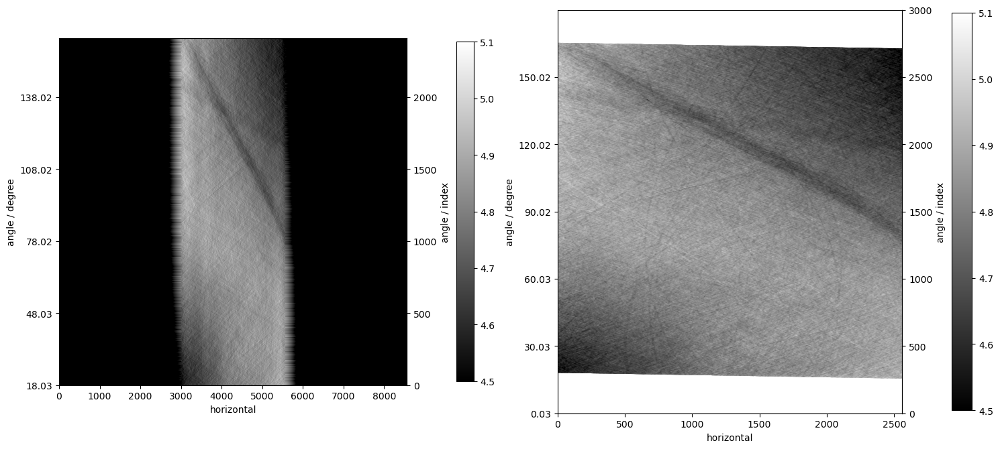

In [32]:
show2D([data_slice, data_slice_uncropped], fix_range=(4.5, 5.1))

In [33]:
# temp = data_slice_uncropped.copy()
# for i in np.arange(data_slice_uncropped.shape[1]):

#     start = start_fit[i]
#     end = end_fit[i]

#     x = data_slice_uncropped.geometry.angles[start:end]
#     y = data_slice_uncropped.array[start:end,i]

#     y_new = np.interp(x, [x[0],x[-1]],[y[0],y[-1]])

#     start_angles = data_slice_uncropped.geometry.angles[0:start]
#     end_angles = data_slice_uncropped.geometry.angles[end:]-180
#     ang_index = len(end_angles)
#     missing_angles = np.concatenate((end_angles,start_angles))
#     y_new = np.interp(missing_angles, [x[-1]-180,x[0]],[y[-1],y[0]])

#     temp.array[0:start,i] = y_new[ang_index:]
#     temp.array[end:,i] = y_new[0:ang_index]



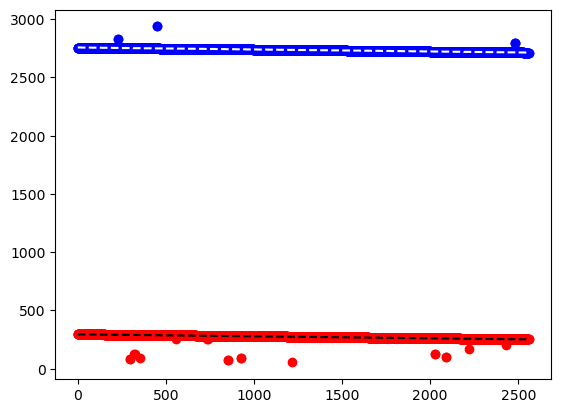

In [34]:
start_array = np.zeros(data_slice_uncropped.shape[1])
end_array = np.zeros(data_slice_uncropped.shape[1])
x = np.arange(data_slice_uncropped.shape[1])
for i in x:

    index = np.where(abs(np.diff(data_slice_uncropped.array[:,i])) > 0.75)[0]
    start_array[i] = index[0]
    end_array[i] = index[-1]

poly1d_fn = np.poly1d(np.polyfit(x,start_array,1)) 
start_fit = np.round(poly1d_fn(x)).astype(int)
plt.plot(x,start_array, 'or', x, start_fit, '--k')

poly1d_fn = np.poly1d(np.polyfit(x,end_array,1)) 
end_fit = np.round(poly1d_fn(x)).astype(int)
plt.plot(x,end_array, 'ob', x, end_fit, '--w')

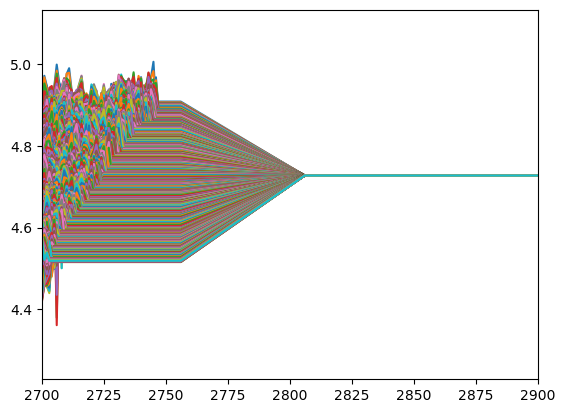

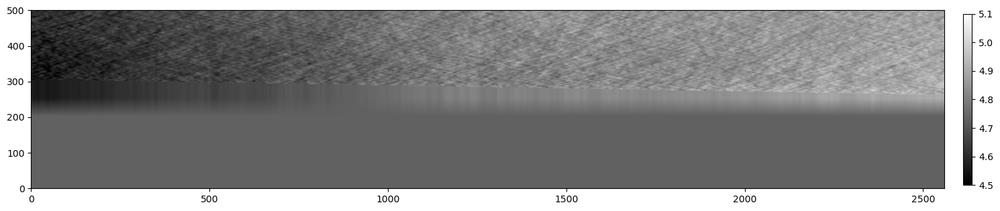

In [35]:
temp = data_slice_uncropped.copy()

lower_limit = np.min(start_fit)
upper_limit = np.max(end_fit)

ramp_width = 50
sino_mean = np.mean(temp.array[np.max(start_fit):np.min(end_fit),i])

for i in np.arange(data_slice_uncropped.shape[1]):
# i = 1000
    start = start_fit[i]+10
    end = end_fit[i]-10

    

    temp.array[lower_limit:start,i] = np.mean(temp.array[start:start+100,i])
    y_new = np.interp(np.arange(lower_limit-ramp_width,lower_limit), [lower_limit-ramp_width,lower_limit], [sino_mean, temp.array[lower_limit,i]])
    temp.array[lower_limit-ramp_width:lower_limit,i] = y_new
    temp.array[0:lower_limit-ramp_width,i] = sino_mean

    temp.array[end:upper_limit,i] = np.mean(temp.array[end-100:end,i])
    y_new = np.interp(np.arange(upper_limit-1,upper_limit+ramp_width-1), [upper_limit-1, upper_limit+ramp_width-1], [temp.array[upper_limit-1,i], sino_mean])
    temp.array[upper_limit-1:upper_limit+ramp_width-1,i] = y_new
    temp.array[upper_limit+ramp_width-1:,i] = sino_mean
    plt.plot(temp.array[:,i])
    plt.xlim([2700, 2900])

show2D(temp.array[0:500,:], fix_range=(4.5,5.1))

In [36]:
padsize = 3000
temp = Padder.linear_ramp(padsize, 0)(temp)

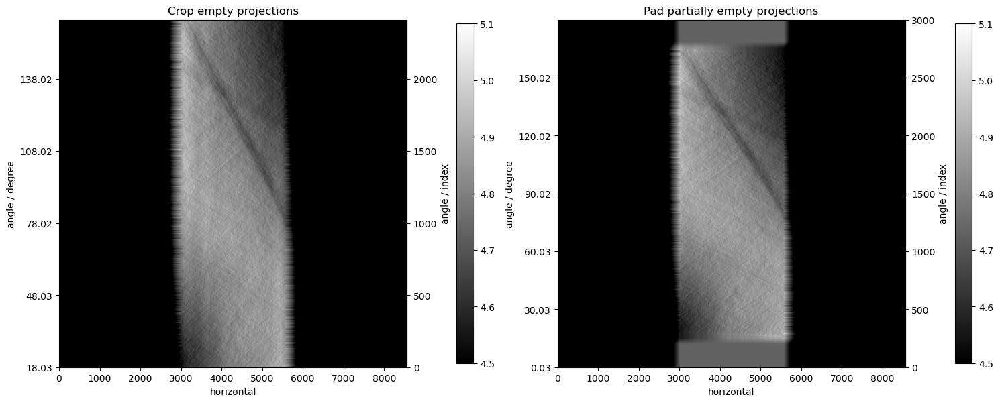

In [37]:
# show2D([data_slice,temp], fix_range=(4.5,5.1))
show2D([data_slice, temp], ['Crop empty projections','Pad partially empty projections'], fix_range=(4.5,5.1))

FBP recon

Input Data:
	angle: 2410
	horizontal: 8560

Reconstruction Volume:
	horizontal_y: 2560
	horizontal_x: 2560

Reconstruction Options:
	Backend: tigre
	Filter: ram-lak
	Filter cut-off frequency: 1.0
	FFT order: 15
	Filter_inplace: False
	Split processing: 0

Reconstructing in 1 chunk(s):

FBP recon

Input Data:
	angle: 3000
	horizontal: 8560

Reconstruction Volume:
	horizontal_y: 2560
	horizontal_x: 2560

Reconstruction Options:
	Backend: tigre
	Filter: ram-lak
	Filter cut-off frequency: 1.0
	FFT order: 15
	Filter_inplace: False
	Split processing: 0

Reconstructing in 1 chunk(s):



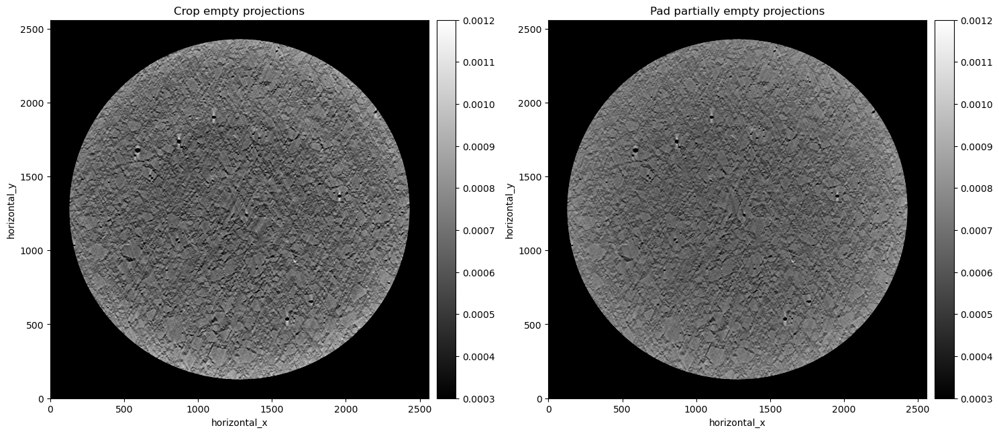

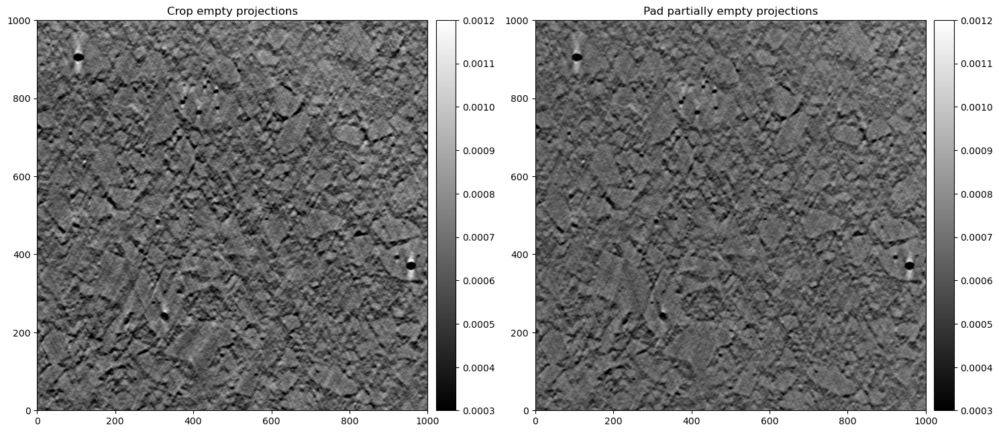

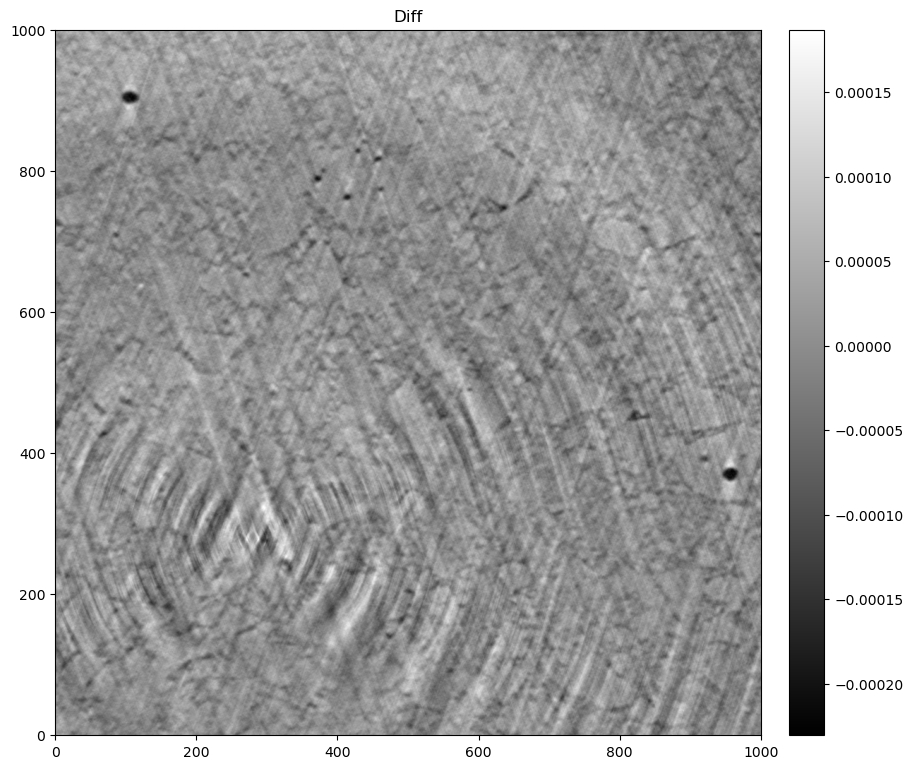

In [40]:
reco_FBP = FBP(data_slice, ig).run()
reco_FBP.apply_circular_mask(0.9)

reco_FBP_uncropped = FBP(temp, ig).run()
reco_FBP_uncropped.apply_circular_mask(0.9)

show2D([reco_FBP,reco_FBP_uncropped], ['Crop empty projections','Pad partially empty projections'], fix_range=(0.0003, 0.0012))
show2D([reco_FBP.array[1000:2000,1000:2000],reco_FBP_uncropped.array[1000:2000,1000:2000]], ['Crop empty projections','Pad partially empty projections'], fix_range=(0.0003, 0.0012))
show2D(reco_FBP.array[1000:2000,1000:2000]-reco_FBP_uncropped.array[1000:2000,1000:2000], 'Diff')

In [76]:
data_filter = data_slice.copy()

fbp = FBP(data_filter, ig)
fbp.set_filter_inplace(True)
fbp.run()

roi = {'horizontal':(padsize, data_filter.shape[1]-padsize, 1)}
processor = Slicer(roi)
processor.set_input(data_filter)
temp = processor.get_output()



FBP recon

Input Data:
	angle: 2410
	horizontal: 8560

Reconstruction Volume:
	horizontal_y: 2560
	horizontal_x: 2560

Reconstruction Options:
	Backend: tigre
	Filter: ram-lak
	Filter cut-off frequency: 1.0
	FFT order: 15
	Filter_inplace: True
	Split processing: 0

Reconstructing in 1 chunk(s):



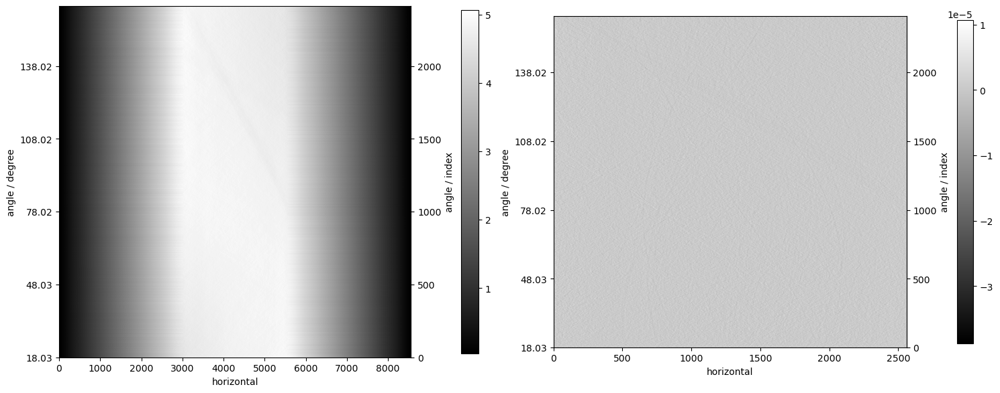

In [78]:
show2D([data_slice, temp])

In [80]:
from cil.plugins.tigre import ProjectionOperator

In [ ]:
reco_FBP = FBP(data_slice, ig).run()
projection_operator = ProjectionOperator(image_geometry=None, acquisition_geometry=temp.geometry,adjoint_weights='FDK')
reco_filter = projection_operator.adjoint(temp)
# reco_filter.apply_circular_mask(0.9)

show2D([reco_FBP,reco_filter], ['Crop empty projections','Filter and crop'])
show2D(reco_FBP.array-reco_filter.array, 'Diff')
show2D([reco_FBP.array[1000:2000,1000:2000],reco_filter.array[1000:2000,1000:2000]], ['Crop empty projections','Filter and crop'])
show2D(reco_FBP.array[1000:2000,1000:2000]-reco_filter.array[1000:2000,1000:2000], 'Diff')

In [86]:
temp.shape

(2410, 2560)

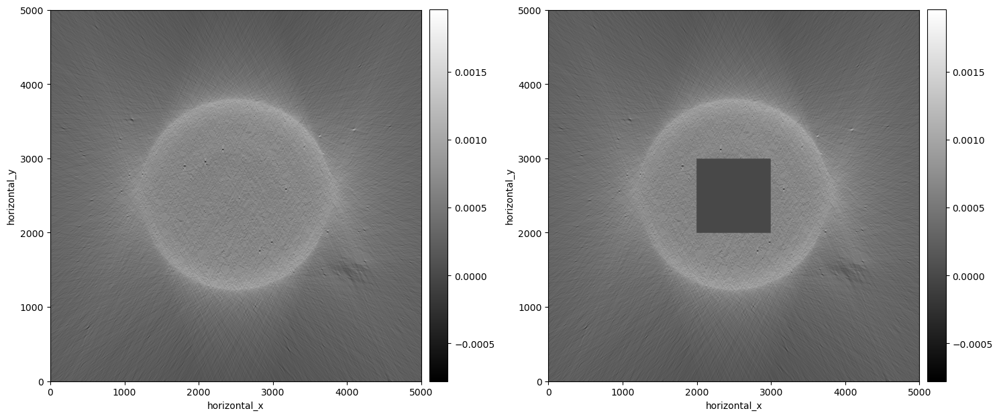

In [109]:
ig_temp = ImageGeometry(5000,5000)
projection_operator = ProjectionOperator(image_geometry=ig_temp, acquisition_geometry=temp.geometry,adjoint_weights='FDK')
reco2 = projection_operator.adjoint(temp)
reco3 = reco2.copy()
reco3.array[2000:3000,2000:3000] = 0

# reco_filter.apply_circular_mask(0.9)

show2D([reco2, reco3])


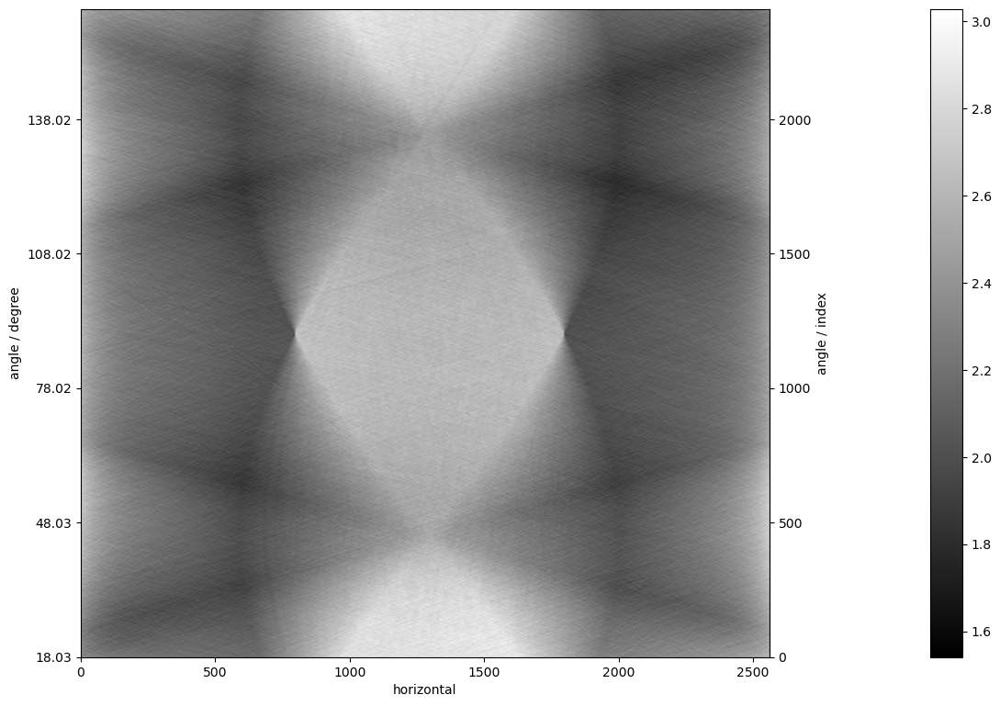

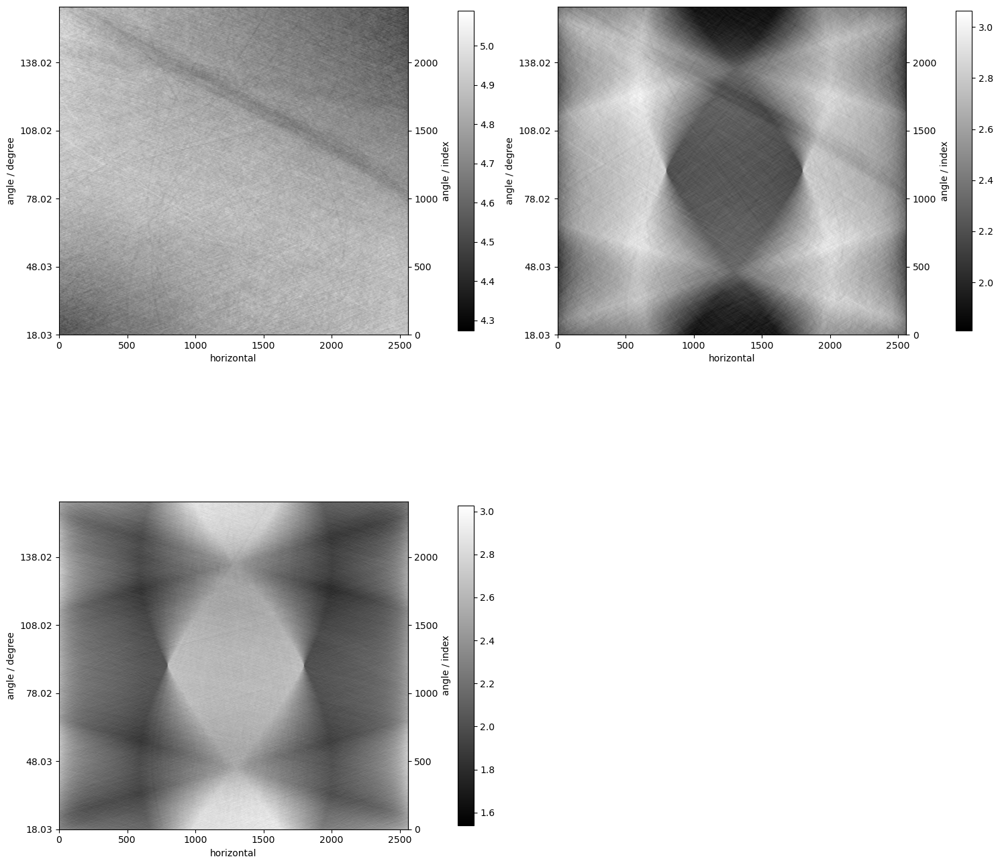

In [110]:

forward_projection = projection_operator.direct(reco3)

projection_operator_full = ProjectionOperator(image_geometry=ig, acquisition_geometry=data_slice.geometry,adjoint_weights='FDK')
forward_projection_full = projection_operator.direct(reco3)

subtracted = data_slice - forward_projection
show2D([data_slice,forward_projection, subtracted])
# show2D(reco_FBP.array-reco_filter.array, 'Diff')
# show2D([reco_FBP.array[1000:2000,1000:2000],reco_filter.array[1000:2000,1000:2000]], ['Crop empty projections','Filter and crop'])
# show2D(reco_FBP.array[1000:2000,1000:2000]-reco_filter.array[1000:2000,1000:2000], 'Diff')

FBP recon

Input Data:
	angle: 2410
	horizontal: 2560

Reconstruction Volume:
	horizontal_y: 2560
	horizontal_x: 2560

Reconstruction Options:
	Backend: tigre
	Filter: ram-lak
	Filter cut-off frequency: 1.0
	FFT order: 13
	Filter_inplace: False
	Split processing: 0

Reconstructing in 1 chunk(s):



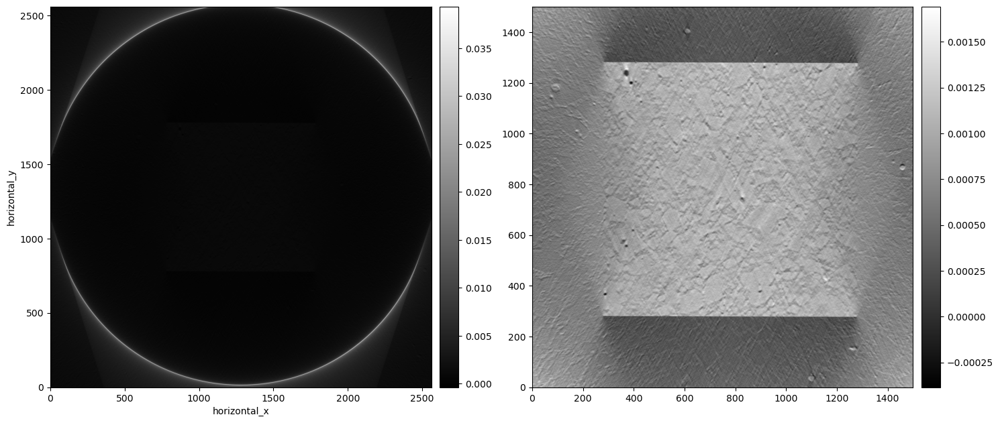

In [106]:
reco_subtracted = FBP(subtracted).run()


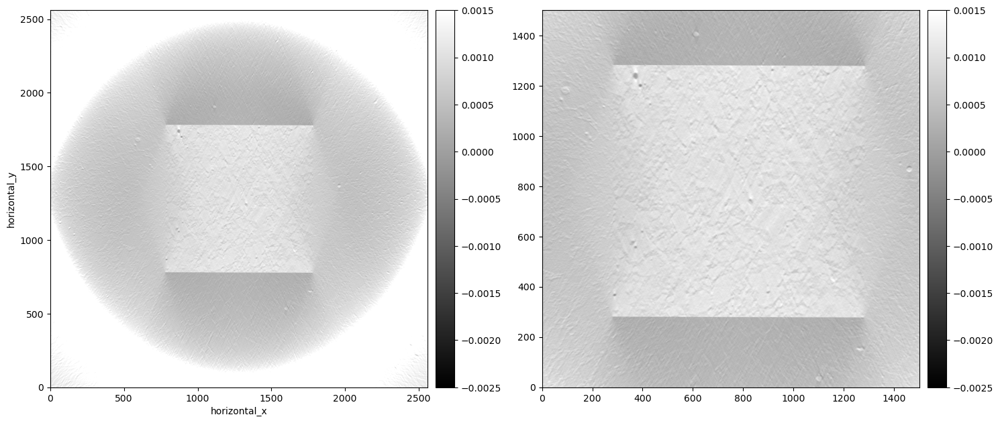

In [107]:

show2D([reco_subtracted,reco_subtracted.array[500:2000, 500:2000]], fix_range=(-0.0025,0.0015))

In [51]:
data_filter.shape[1]

8560

In [ ]:
from cil.optimisation.functions import L2NormSquared, BlockFunction, L1Norm, ZeroFunction, MixedL21Norm, IndicatorBox, TotalVariation
from cil.optimisation.algorithms import PDHG
from cil.optimisation.operators import BlockOperator, FiniteDifferenceOperator, GradientOperator
from cil.plugins.astra import ProjectionOperator

In [ ]:
def algo_anisotropic_x_TV(data_slice, alpha, alpha_dx, sigma=0.5, initial=None):

    ag = data_slice.geometry
    ig = ag.get_ImageGeometry()

    F = BlockFunction(0.5*L2NormSquared(b=data_slice),
                          alpha*MixedL21Norm(), 
                          alpha_dx*L1Norm())

    K = BlockOperator(ProjectionOperator(ig, ag), 
                         GradientOperator(ig), 
                         FiniteDifferenceOperator(ig, direction='horizontal_x'))

    G = ZeroFunction()

    normK = K.norm()
    tau = 1./(sigma*normK**2)

    myPDHG = PDHG(f=F, 
                g=G, 
                operator=K, 
                sigma = sigma, tau = tau,
                initial = initial,
                max_iteration=2000, 
                update_objective_interval = 10,
                )

    return myPDHG

In [ ]:
def algo_anisotropic_y_TV(data_slice, alpha, alpha_dy, sigma=0.5, initial=None):

    ag = data_slice.geometry
    ig = ag.get_ImageGeometry()

    F = BlockFunction(0.5*L2NormSquared(b=data_slice),
                          alpha*MixedL21Norm(), 
                          alpha_dy*L1Norm())

    K = BlockOperator(ProjectionOperator(ig, ag), 
                         GradientOperator(ig), 
                         FiniteDifferenceOperator(ig, direction='horizontal_y'))

    G = ZeroFunction()

    normK = K.norm()
    tau = 1./(sigma*normK**2)

    myPDHG = PDHG(f=F, 
                g=G, 
                operator=K, 
                sigma = sigma, tau = tau,
                initial = initial,
                max_iteration=2000, 
                update_objective_interval = 10,
                )

    return myPDHG

In [ ]:
def algo_isotropic_TV(data_slice, alpha, initial=None):

    ag = data_slice.geometry
    ig = ag.get_ImageGeometry()

    F = BlockFunction(alpha * MixedL21Norm(),
        0.5*L2NormSquared(b=data_slice))

    K = BlockOperator(GradientOperator(ig), 
                      ProjectionOperator(ig, ag, device="gpu"))
    
    G = IndicatorBox(lower=0)

    normK = K.norm()
    sigma = 0.5
    tau = 1./(sigma*normK**2)

    myPDHG = PDHG(f=F, 
                g=G, 
                operator=K, 
                sigma = sigma, tau = tau,
                initial = initial,
                max_iteration=2000, 
                update_objective_interval = 10,
                )
    
    return myPDHG

In [ ]:
def algo_isotropic_TV_implicit(data_slice, alpha, initial=None):

    ag = data_slice.geometry
    ig = ag.get_ImageGeometry()

    F = 0.5 * L2NormSquared(b=data_slice)
    
    G = (alpha/ig.voxel_size_y) *TotalVariation(max_iteration=10)
    
    K = ProjectionOperator(ig, ag, device='gpu')

    normK = K.norm()
    sigma = 0.5
    tau = 1./(sigma*normK**2)

    myPDHG = PDHG(f=F, 
                g=G, 
                operator=K, 
                sigma = sigma, tau = tau,
                initial = initial,
                max_iteration=2000, 
                update_objective_interval = 10,
                )
    
    return myPDHG

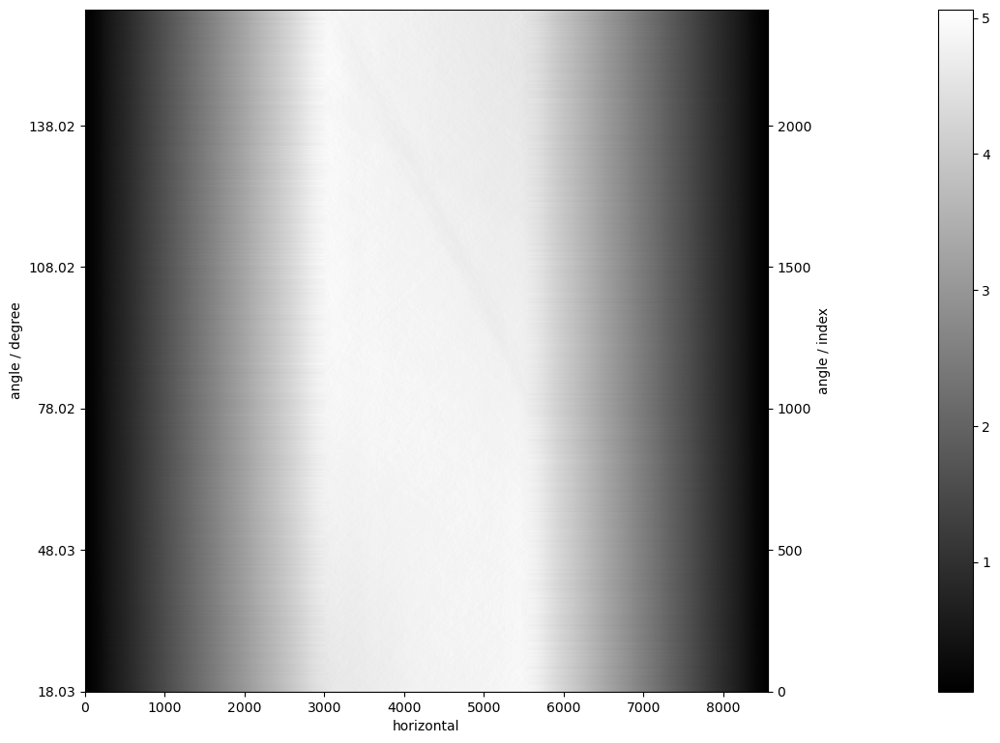

In [ ]:
show2D(data_slice)

In [ ]:
print(data_slice.geometry.angles)

[ 18.029413  18.089453  18.149298 ... 162.43645  162.4964   162.55649 ]


In [ ]:
alpha = 0.05
alpha_dy = 0.01
sigma = 0.1

myPDHG = algo_anisotropic_y_TV(data_slice, alpha=alpha, alpha_dy=alpha_dy, sigma=sigma, initial=None)
myPDHG.run(200,verbose=2)

In [ ]:
reco = myPDHG.solution

reco = Slicer(roi={'horizontal_y': (3000,5560), 'horizontal_x' : (3000,5560)})(reco)
writer = NEXUSDataWriter()
writer.set_up(data=reco,
        file_name='aniso_reco_alpha005_sigma001.nxs')
writer.write()

In [ ]:
reco.apply_circular_mask(0.9)
show2D(reco.array, fix_range=(reco.max()*0.3, reco.max()*1))
show2D(reco.array[1000:2000,1000:2000],  fix_range=(reco.max()*0.9, reco.max()*0.2))

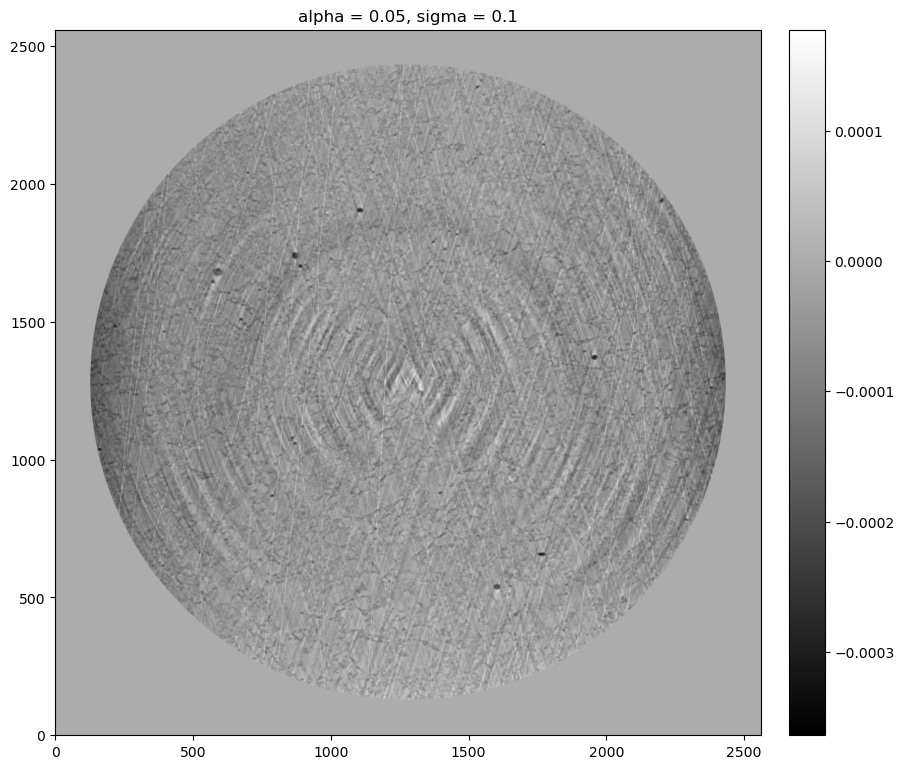

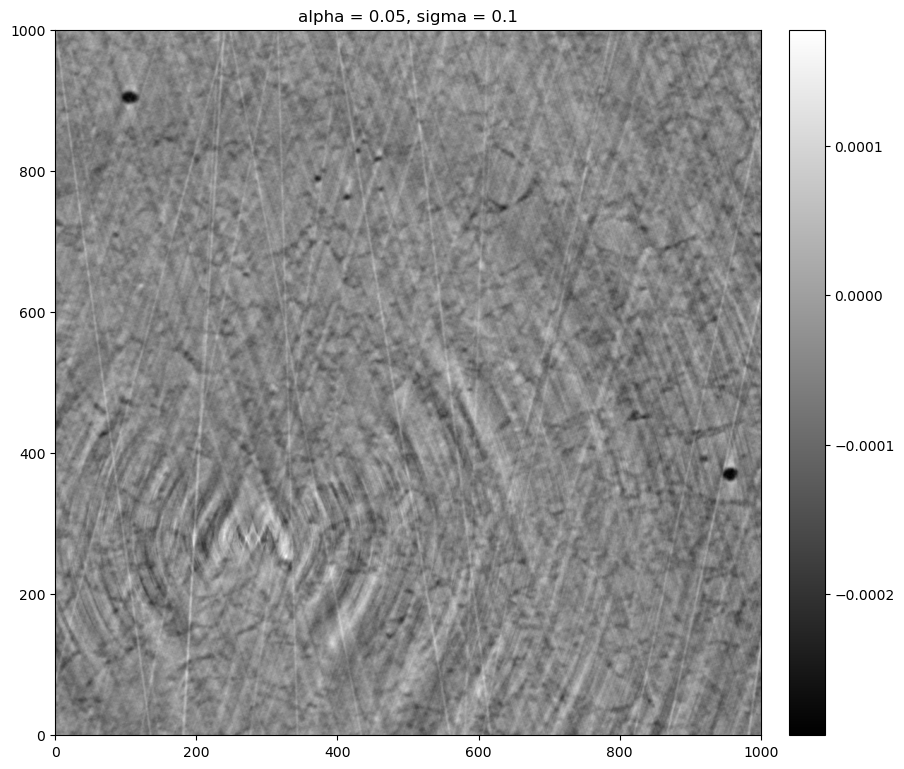

In [ ]:
show2D(reco_FBP.array-reco_FBP2.array, title='alpha = 0.05, sigma = 0.1')
show2D((reco_FBP.array-reco_FBP2.array)[1000:2000,1000:2000], title='alpha = 0.05, sigma = 0.1')

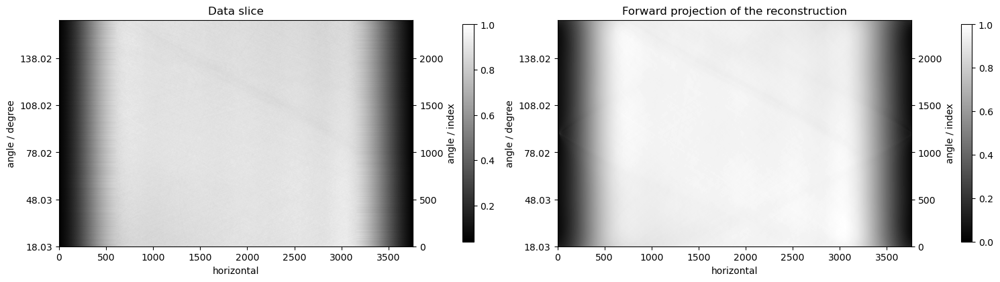

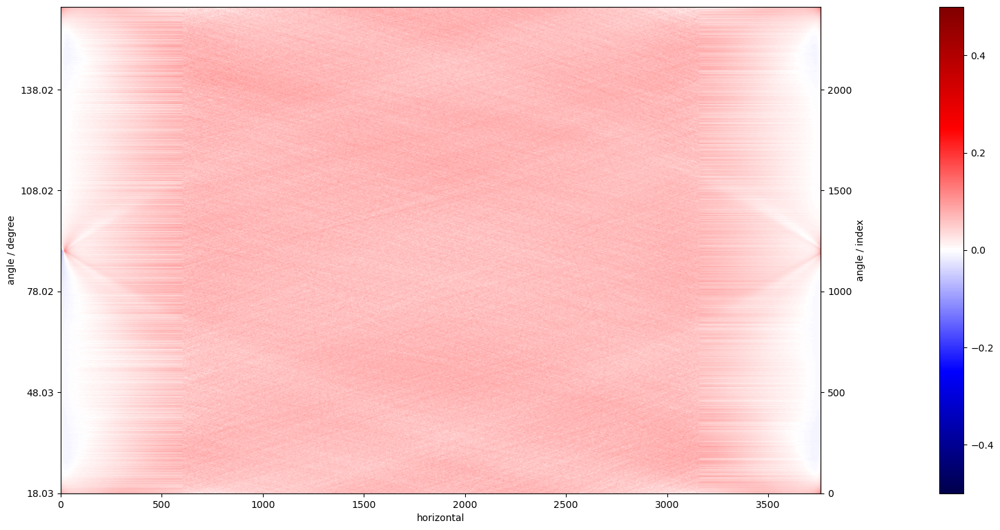

In [ ]:
forward_projection = ProjectionOperator(reco.geometry, data_slice.geometry).direct(reco)
residuals = forward_projection/np.max(forward_projection) - data_slice/np.max(data_slice)


show2D([data_slice/np.max(data_slice), forward_projection/np.max(forward_projection)],title=['Data slice', 'Forward projection of the reconstruction'])
show2D(residuals, fix_range = (-0.5, 0.5), cmap='seismic')

In [ ]:
from cil.plugins.astra import FBP

     Iter   Max Iter     Time/Iter        Primal          Dual     Primal-Dual
                               [s]     Objective     Objective             Gap
        0       1000         0.000    3.33900e+06  -0.00000e+00    3.33900e+06
       10       1000         1.782    5.87173e+05  -1.23055e+09    1.23113e+09
       20       1000         1.786    5.08073e+05  -7.34880e+08    7.35389e+08
       30       1000         1.792    4.28042e+05  -5.38128e+08    5.38557e+08
       40       1000         1.789    3.66870e+05  -4.24431e+08    4.24798e+08
       50       1000         1.790    3.14002e+05  -3.56187e+08    3.56501e+08
----------------------------------------------------------------------------
       50       1000         1.790    3.14002e+05  -3.56187e+08    3.56501e+08
Stop criterion has been reached.



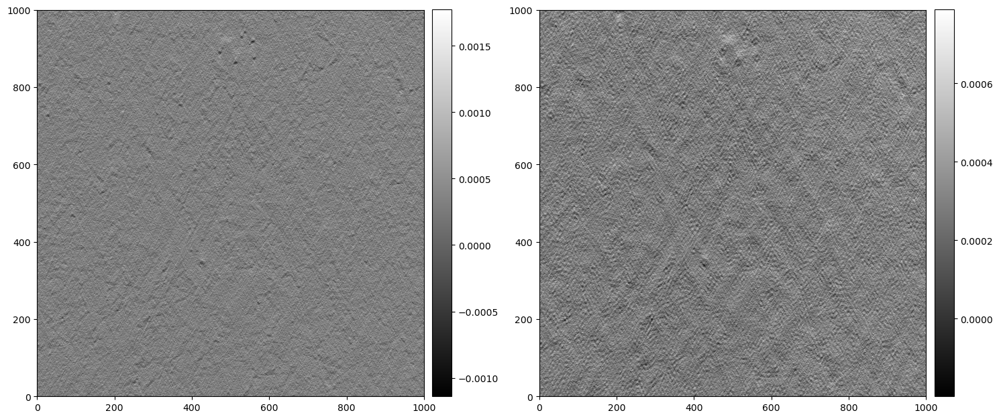

In [ ]:
data_phase = data_slice.array.reshape(data_slice.shape + (1,))
alpha = 0.005
data_phase = retrieve_phase(data_phase, pixel_size=6.5e-4, dist=30, energy=19,  alpha=alpha)
data_phase = data_phase.squeeze()
data_phase = AcquisitionData(data_phase, deep_copy=False, geometry = data_slice.geometry)

# reco_phase_FBP = FBP(data_phase, ig_prepad, backend='astra').run()
reco_phase_FBP = FBP(ig, ag, device='gpu')(data_phase)
reco_phase_FBP = Padder.constant( padsize, float(reco_phase_FBP.mean()))(reco_phase_FBP)
reco_phase = algo(data_phase, initial=reco_phase_FBP)

show2D([reco_phase_FBP.array[1500:2500,1500:2500], reco_phase.array[1500:2500,1500:2500]])

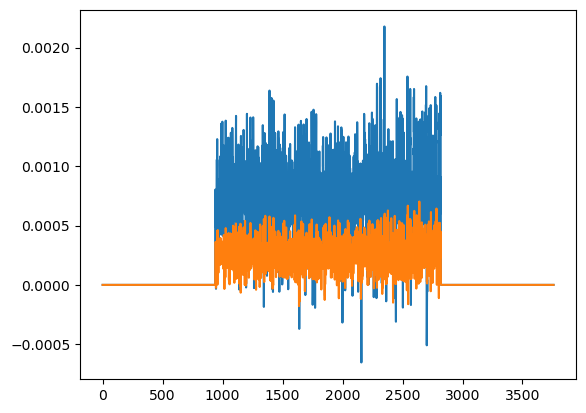

In [ ]:
plt.plot(reco.array[:,int(reco.shape[0]/2)])
plt.plot(reco_phase.array[:,int(reco.shape[0]/2)])